In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage.filters import gaussian_filter1d
import warnings
warnings.filterwarnings("ignore")
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import gaussian_filter1d


/var/folders/mc/qbcjsrl16h3gf6t6xvz8czzw0000gn/T/ipykernel_33735/3678307045.py:6: DeprecationWarning: Please import `gaussian_filter1d` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter1d


### Recreate the neural PCA data from the paper

example Main Variables

In [168]:
trials = [[[1,2,3],[4,5,6],[7,8,9],[10,11,12]],[[13,14,15],[16,17,18],[19,20,21],[22,23,24]],[[25,26,27],[28,29,30],[31,32,33],[34,35,36]],[[37,38,39],[40,41,42],[43,44,45],[46,47,48]],[[49,50,51],[52,53,54],[55,56,57],[58,59,60]]]
trials = np.array(trials)
print(trials.shape)

trial_types = np.array([0., 22.5, 45., 67.5, 90., 112.5, 135., 157.5])

trial_type = np.random.choice(trial_types, 5)

t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]


frames_pre_stim = 0
frames_post_stim = 1

(5, 4, 3)


In [207]:
trials = [[[1,2,3],[4,5,6],[7,8,9],[10,11,12]],
          [[13,14,15],[16,17,18],[19,20,21],[22,23,24]],
          [[25,26,27],[28,29,30],[31,32,33],[34,35,36]],
          [[37,38,39],[40,41,42],[43,44,45],[46,47,48]],
          [[49,50,51],[52,53,54],[55,56,57],[58,59,60]]]
trials = np.array(trials)
print(trials.shape)  # Expected output: (5, 4, 3)

trial_types = np.array([0., 22.5, 45.])
trial_type = np.random.choice(trial_types, 5)  # Randomly assigning a trial type to each of the 5 trials
# trial_types = np.unique(trial_type)  # This should list all unique types present in your trial_type array
print(trial_type)
# t_type_ind = [np.argwhere(trial_type == t_type)[:, 0] for t_type in trial_types]
t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]


(5, 4, 3)
[45.  22.5 45.   0.  45. ]


In [208]:
rec_freq     = 12.7
# start_stim   = events['start_stim'] / rec_freq
# end_stim     = events['end_stim'] / rec_freq
# session_type = data['session_type']
# time         = events['time'] / rec_freq
trial_size   = trials[0].shape[1]
Nneurons     = trials[0].shape[0]

In [209]:
trial_size   = trials[0].shape[1]
Nneurons     = trials[0].shape[0]
print(f'trial size (ie. number bins per trial): {trial_size}')
print(f'Nneurons (ie. number of neurons in each trial): {Nneurons}')

trial size (ie. number bins per trial): 3
Nneurons (ie. number of neurons in each trial): 4


In [210]:
print(f'number of trials: {len(trials)}')
print(f'types of trials (orientations): {trial_types}')
print(f'dimension of a single trial array (n_neurons, n_timebins): {(trials[0].shape)}' )
print(f'Trial type of the first 3 trials: {trial_type[0:3]}')
print(f't_type_ind: {t_type_ind}')



number of trials: 5
types of trials (orientations): [ 0.  22.5 45. ]
dimension of a single trial array (n_neurons, n_timebins): (4, 3)
Trial type of the first 3 trials: [45.  22.5 45. ]
t_type_ind: [array([3]), array([1]), array([0, 2, 4])]


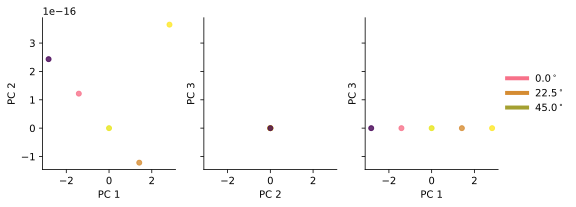

In [211]:
# Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) for t in trials]).T


# or take the max
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].max(axis=1) for t in trials]).T

# or the baseline-corrected mean
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) - t[:, 0:frames_pre_stim].mean(axis=1) for t in trials]).T

# Xr_sc = z_score(Xr)

# pca = PCA(n_components=4)
# Xp = pca.fit_transform(Xr_sc.T).T

# projections = [(0, 1), (1, 2), (0, 2)]
# fig, axes = plt.subplots(1, 3, figsize=[9, 3], sharey='row', sharex='row')
# for ax, proj in zip(axes, projections):
#     for t, t_type in enumerate(trial_types):
#         x = Xp[proj[0], t_type_ind[t]]
#         y = Xp[proj[1], t_type_ind[t]]
#         ax.scatter(x, y, c=pal[t], s=25, alpha=0.8)
#         ax.set_xlabel('PC {}'.format(proj[0]+1))
#         ax.set_ylabel('PC {}'.format(proj[1]+1))
# sns.despine(fig=fig, top=True, right=True)
# add_orientation_legend(axes[2])

# Trial-Averged Response

example data

In [252]:
trial_averages = []

for ind in t_type_ind:  
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
    print(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)
# Xa.shape, Xa,

0
[[18.70503597  7.55395683  7.91366906 ... 12.23021583  8.63309353
  10.79136691]
 [25.89928058 11.51079137 15.10791367 ... 15.82733813 14.38848921
  11.8705036 ]
 [ 0.          0.          0.         ...  0.35971223  0.
   0.71942446]
 ...
 [ 0.71942446  0.71942446  0.35971223 ...  0.          0.
   0.        ]
 [28.05755396 16.54676259 11.8705036  ... 18.70503597 12.94964029
  10.43165468]
 [ 0.71942446  0.35971223  0.71942446 ...  0.35971223  0.71942446
   0.71942446]]
1
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


In [215]:
n_components = 3
Xa = z_score(Xa) #Xav_sc = center(Xav)
pca = PCA(n_components=n_components)
Xa_p = pca.fit_transform(Xa.T).T

In [220]:
time_interval = 1000  # 10 ms represented in seconds
time = np.arange(0, trial_size * time_interval, time_interval)
time

array([   0, 1000, 2000])

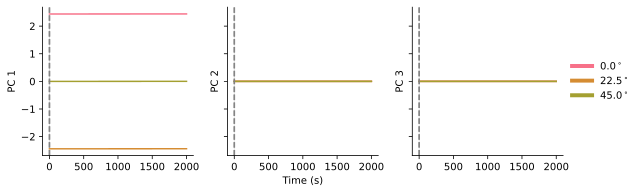

In [221]:
fig, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey='row')
for comp in range(3):
    ax = axes[comp]
    for kk, type in enumerate(trial_types):
        x = Xa_p[comp, kk * trial_size :(kk+1) * trial_size]
        x = gaussian_filter1d(x, sigma=3)
        ax.plot(time, x, c=pal[kk])
    add_stim_to_plot(ax)
    ax.set_ylabel('PC {}'.format(comp+1))
add_orientation_legend(axes[2])
axes[1].set_xlabel('Time (s)')
sns.despine(fig=fig, right=True, top=True)
plt.tight_layout(rect=[0, 0, 0.9, 1])

# Start My Data

### Match my neural data to the neural data used in the paper

my main variables

In [416]:
units_to_use_index = [0,9,13,14,15,17,19,20,21,22,23,24,25,26,27,29,31,32,36,37]
len(units_to_use_index)

20

In [417]:
import pandas as pd
path = 'reach1_4_annotattions_complete.csv'

# load a csv file
df = pd.read_csv(path)

df = df.iloc[0:278, :]

data = df['win_loose'].values
data = [int(values) for values in data]   
data = np.array(data)
print(data)

df


[1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0
 1 1 1 1 1 1 1 0 0 1 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 0 0 0 0 0 1 0 0 1 1
 0 1 1 0 1 1 0 0 0 1 0 1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 1 1 0 0 1 1 1 1 0 1
 1 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 1 0 1 1 0 1
 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 1 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 1 0 0 1 0
 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 1 0 0 1 1 0 1 1 1 0 0 0 1 0 0 0 1 0 0
 0 1 1 0 0 1 0 1 1 1 0 1 1 0 0 0 1 0 1]


,n_reach,label,win_loose,converted_time,time,lable_types
0,1,s2,1,0:01:32,1:32,"m = multiple reach attemps, w/ fail"
1,2,m,0,0:03:01,3:01,n = no reach attempt
2,3,s1,1,0:04:30,4:30,s1= success 1st attempt
3,4,m,0,0:05:59,5:59,s2 = success > 1st try
4,5,m,0,0:07:28,7:28,Sh = short of pellet
...,...,...,...,...,...,...
273,274,d,0,8:13:01,493:01:00,NaN
274,275,d,0,8:14:30,494:30:00,NaN
275,276,s2,1,8:15:58,495:58:00,NaN
276,277,d,0,8:17:28,497:28:00,NaN


In [418]:
success_index = np.where(data == 1)
failure_index =  np.where(data == 0)
len(success_index[0]),len(failure_index[0])

(127, 151)

In [419]:
# hist_loaded_b = np.load('/Users/grant/Documents/GitHub/PCA_on_neural_data/hist/reach1_4_1_10_window_50ms_FR_hist_B.npy', allow_pickle=True)
binned_data_path = 'reach1_4_1_10_window_50ms_FR_per_trial_B'
trials = np.load(f'/Users/grant/Documents/GitHub/PCA_on_neural_data/per_trial/{binned_data_path}.npy', allow_pickle=True)
print(trials.shape)
transposed_data = np.transpose(trials, axes=(1, 0, 2))
trials = transposed_data
print(trials.shape)
trial_size   = trials[0].shape[1]


trial_types = np.array([0.])

trial_type = np.zeros(278)

t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]

# FOR 10ms Bins 1_5
# frames_pre_stim = 50
# frames_post_stim = 350

# FOR 50ms Bins 1_10
frames_pre_stim = 10
frames_post_stim = 180


(538, 278, 240)
(278, 538, 240)


In [420]:
trials = trials[0:200, :, :]
print(trials.shape)

trials.shape

(200, 538, 240)


(200, 538, 240)

In [378]:
m1_good_units_to_use = [1,7,8,9,10,12,13,19,20,21,22,23,24,25,27,29,30,31,35,41,44]

# keep first 200 reaches
trials = trials[0:200, :, :]
print(trials.shape)

# Keep only the good units
trials = trials[:, m1_good_units_to_use, :]
print(trials.shape)





(200, 538, 240)
(200, 21, 240)


Removing units that are not perfect for M1 / Probe A

In [421]:
# trials = trials[:, units_to_use_index, :]
# trials.shape


Set time_interval to the bin size of your data 
if 10ms bins use 0.01

In [422]:
time_interval = 0.05  # 10 ms represented in seconds
time = np.arange(0, trial_size * time_interval, time_interval)
time[0],time[-1]

(0.0, 11.950000000000001)

## Uncomment cell below to see how breaking up this nerual data into junks results in identical neural trajectories

In [423]:

trial_types = np.array([0.,1.])
trial_type = np.zeros(200)

# Assign trial types based on the intervals

# keep firsr 200 reaches 
data = data[:200]
print(data.shape)
# 0 = successful reach
# 1 = Failed Reach

trial_type[0::] = data

t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]
# print(t_type_ind)
print(trial_type)


(200,)
[1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 1.
 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0.
 1. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.
 1. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0.
 0. 1. 0. 0. 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1.
 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1. 0.
 1. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0.
 0. 1. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.
 1. 0. 1. 1. 1. 0. 0. 1.]


In [424]:

trial_types = np.array([0.,1,2,3,4])
trial_type = np.zeros(200)

# Assign trial types based on the intervals
# 0 = baseline (ie. first 40)
# 1 = perturbation trials (40 reaches with pert going on) (not really here. just for comparing)
# 2 = washout trials (40 reaches after stimulation removed) (not really here. just for comparing)

trial_type[0:40] = 0
trial_type[40:80] = 1
trial_type[80:120] = 2
trial_type[120:160] = 3
trial_type[160:200] = 4
# trial_type[200:240] = 0
# trial_type[240:277] = 1




t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]
print(t_type_ind)


[array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39]), array([40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
       57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73,
       74, 75, 76, 77, 78, 79]), array([ 80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,
        93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105,
       106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118,
       119]), array([120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132,
       133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145,
       146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158,
       159]), array([160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172,
       173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185,
       186, 187, 188, 189, 19

## Or Uncomment cell below to see how breaking up this nerual data into junks results in identical neural trajectories

In [425]:
# trial_types = np.array([0.,1.,2.,3.,4.,5.,6.])

# # Define trial types based on your description
# trial_type = np.zeros(278)  # initialize array for all trials

# # Assign trial types based on the intervals
# # Type 0 intervals: 0-30, 60-90, 150-169
# # Type 1 intervals: 30-60, 90-120, 120-150, 169-182
# trial_type[0:40] = 0
# trial_type[40:80] = 1
# trial_type[80:120] = 2
# trial_type[120:160] = 3
# trial_type[160:200] = 4 
# trial_type[200:240] = 5
# trial_type[240:278] = 6

# t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]



In [426]:
trial_size   = trials[0].shape[1]
Nneurons     = trials[0].shape[0]
print(f'trial size in bins: {trial_size}')
print(f'Nneurons: {Nneurons}')

trial size in bins: 240
Nneurons: 538


In [427]:
print(f'number of trials: {len(trials)}')
print(f'types of trials (0==baseline, 1==pert): {trial_types}')
print(f'dimension of a single trial array (n_neurons, n_timebins): {(trials[0].shape)}' )
print(f'Trial type of the first 3 trials: {trial_type[0:3]}')
print(f't_type_ind: {t_type_ind[0][0:5]}')

trials.shape

number of trials: 200
types of trials (0==baseline, 1==pert): [0. 1. 2. 3. 4.]
dimension of a single trial array (n_neurons, n_timebins): (538, 240)
Trial type of the first 3 trials: [0. 0. 0.]
t_type_ind: [0 1 2 3 4]


(200, 538, 240)

In [428]:
# Start and end of reach initation in seconds
start_stim = 0.5
end_stim = 3

In [429]:
shade_alpha      = 0.2
lines_alpha      = 0.8
pal = sns.color_palette('husl', 9)
%config InlineBackend.figure_format = 'svg'

# REMOVING this gray box
# def add_stim_to_plot(ax):
#     ax.axvspan(start_stim, end_stim, alpha=shade_alpha,
#                color='gray')
#     ax.axvline(start_stim, alpha=lines_alpha, color='gray', ls='--')
#     ax.axvline(end_stim, alpha=lines_alpha, color='gray', ls='--')

def add_stim_to_plot(ax):
    ax.axvspan(start_stim, end_stim, alpha=shade_alpha,
               color='gray')
    ax.axvline(start_stim, alpha=lines_alpha, color='gray', ls='--')
    ax.axvline(end_stim, alpha=lines_alpha, color='gray', ls='--')
    
def add_orientation_legend(ax):
    custom_lines = [Line2D([0], [0], color=pal[k], lw=4) for
                    k in range(len(trial_types))]
    labels = ['{}$^\circ$'.format(t) for t in trial_types]
    ax.legend(custom_lines, labels,
              frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout(rect=[0,0,0.9,1])

### Z-score

In [430]:
def z_score(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=True)
    Xz = ss.fit_transform(X.T).T
    return Xz

# X = np.array([[5., 6., 5.],
#               [50., 60., 50.]]) # data array of shape n_neuron by n_time_points
# X = z_score(X)
# c = np.cov(X, rowvar=True) # covariance matrix
# eig_vals, eig_vecs = np.linalg.eig(c)
# srt = np.argsort(eig_vals)[::-1]
# print('Sorted eigenvalues: \n{}'.format(eig_vals[srt]))
# print('\nFirst eigenvector: \n{}'.format(eig_vecs[:, srt][:, 0]))

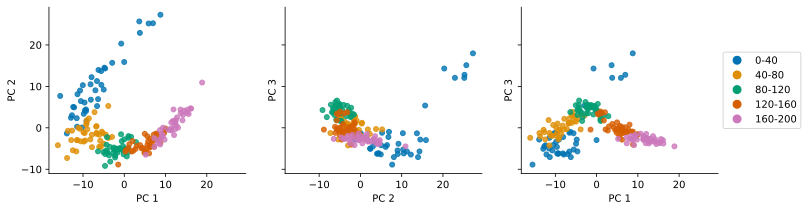

In [452]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

Xr_sc = z_score(Xr)

# Perform PCA
pca = PCA(n_components=12)
Xp = pca.fit_transform(Xr_sc.T).T

# Define projections
projections = [(0, 1), (1, 2), (0, 2)]

# Toggle for color-blind friendly palette
color_blind = True

# Define color palette based on the toggle
if color_blind:
    pal = sns.color_palette("colorblind", len(trial_types))
else:
    pal = sns.color_palette("husl", len(trial_types))

# Custom labels for the legend
custom_labels = ['0-40', '40-80', '80-120','120-160', '160-200']

# Plot
fig, axes = plt.subplots(1, 3, figsize=[12, 3], sharey='row', sharex='row')
for ax, proj in zip(axes, projections):
    for t, t_type in enumerate(trial_types):
        x = Xp[proj[0], t_type_ind[t]]
        y = Xp[proj[1], t_type_ind[t]]
        ax.scatter(x, y, c=[pal[t]], s=25, alpha=0.8)  # Set color using the palette
        ax.set_xlabel('PC {}'.format(proj[0]+1))
        ax.set_ylabel('PC {}'.format(proj[1]+1))

# Style adjustments
sns.despine(fig=fig, top=True, right=True)

# Function to add a legend (example function, adapt as needed)
def add_orientation_legend(ax, labels, palette):
    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], marker='o', color='w', label=labels[i], 
                              markerfacecolor=palette[i], markersize=10) for i in range(len(labels))]
    ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5))

add_orientation_legend(axes[2], custom_labels, pal)

plt.show()

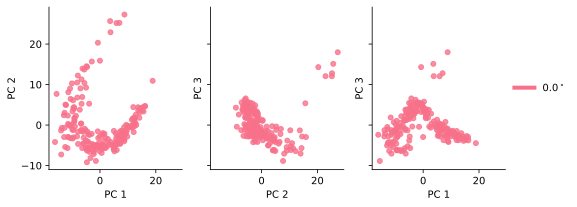

In [394]:
Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) for t in trials]).T

# or take the max
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].max(axis=1) for t in trials]).T

# or the baseline-corrected mean
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) - t[:, 0:frames_pre_stim].mean(axis=1) for t in trials]).T

Xr_sc = z_score(Xr)
pca = PCA(n_components=15)
Xp = pca.fit_transform(Xr_sc.T).T

projections = [(0, 1), (1, 2), (0, 2)]
fig, axes = plt.subplots(1, 3, figsize=[9, 3], sharey='row', sharex='row')
for ax, proj in zip(axes, projections):
    for t, t_type in enumerate(trial_types):
        x = Xp[proj[0], t_type_ind[t]]
        y = Xp[proj[1], t_type_ind[t]]
        ax.scatter(x, y, c=pal[t], s=25, alpha=0.8)
        ax.set_xlabel('PC {}'.format(proj[0]+1))
        ax.set_ylabel('PC {}'.format(proj[1]+1))
sns.despine(fig=fig, top=True, right=True)
add_orientation_legend(axes[2])

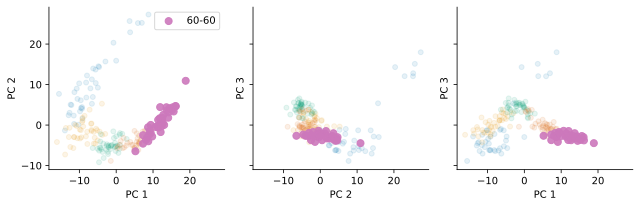

In [458]:
# Setup for plots
projections = [(0, 1), (1, 2), (0, 2)]
fig, axes = plt.subplots(1, 3, figsize=[9, 3], sharey=True, sharex=True)

# Specific trial type to highlight
highlight_type = 4.  # Ensure this matches one of your trial_types

for ax, proj in zip(axes, projections):
    for t, t_type in enumerate(trial_types):
        x = Xp[proj[0], t_type_ind[t]]
        y = Xp[proj[1], t_type_ind[t]]
        label = f'60-60' if t_type == highlight_type else '_nolegend_'
        ax.scatter(x, y, c=pal[t], s=50 if t_type == highlight_type else 25, alpha=0.9 if t_type == highlight_type else 0.1, label=label)

        ax.set_xlabel(f'PC {proj[0] + 1}')
        ax.set_ylabel(f'PC {proj[1] + 1}')


sns.despine(fig=fig, right=True, top=True)

# Adding a legend to the first subplot which can be adapted as needed
axes[0].legend(loc='best')
plt.tight_layout()
plt.show()

# Trial-Averged Response

my data

In [434]:
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)


In [435]:
Xa.shape


(538, 1200)

In [436]:
n_components = 15
Xa = z_score(Xa) #Xav_sc = center(Xav)
pca = PCA(n_components=n_components)
Xa_p = pca.fit_transform(Xa.T).T
Xa_p.shape

(15, 1200)

TypeError: add_orientation_legend() missing 2 required positional arguments: 'labels' and 'palette'

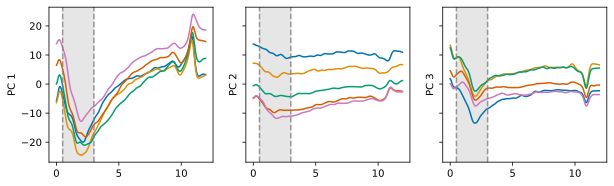

In [438]:
fig, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey='row')
for comp in range(3):
    ax = axes[comp]
    for kk, type in enumerate(trial_types):
        x = Xa_p[comp, kk * trial_size :(kk+1) * trial_size]
        x = gaussian_filter1d(x, sigma=3)
        ax.plot(time, x, c=pal[kk])
    # add_stim_to_plot(ax)
    add_stim_to_plot(ax)
    ax.set_ylabel('PC {}'.format(comp+1))
add_orientation_legend(axes[2])
axes[1].set_xlabel('Time (s)')
sns.despine(fig=fig, right=True, top=True)
plt.tight_layout(rect=[0, 0, 0.9, 1])

In [ ]:
units, m1_good_units_to_use[1]



(array([ 3, 19, 11]), 7)

TypeError: add_orientation_legend() missing 2 required positional arguments: 'labels' and 'palette'

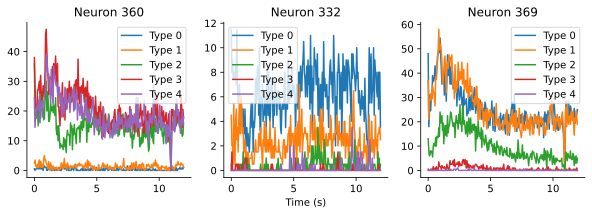

In [439]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Example setup, replace with your actual pca, trials, etc.
# pca.components_[1, :] might be your way of accessing the eigenvectors.
units = np.abs(pca.components_[1, :]).argsort()[::-1][:3]

f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=False, sharex=True)

for ax, unit in zip(axes, units):
    ax.set_title(f'Neuron {unit}')
    for t, ind in enumerate(t_type_ind):
        x = np.array(trials)[ind][:, unit, :]  # Extracting the data for the neuron 'unit' across all trials of type 't'
        sns.lineplot(x=time, y=x.mean(axis=0), ax=ax,
                     ci=95,  # 95% confidence interval
                     label=f'Type {t}')  # Assuming 't' can be used as a label

    # add_stim_to_plot(ax)  # Make sure this function is correctly defined elsewhere in your code

axes[1].set_xlabel('Time (s)')
sns.despine(fig=f, right=True, top=True)
add_orientation_legend(axes[2])  # Ensure this function is defined appropriately

plt.tight_layout()
plt.show()


## Trial-concatenated PCA
my data

In [ ]:
trials.shape

(200, 538, 240)

In [ ]:
Xl = np.hstack(trials)
trials.shape, Xl.shape


((200, 538, 240), (538, 48000))

In [ ]:
Xl = z_score(Xl)
pca = PCA(n_components=15)
Xl_p = pca.fit_transform(Xl.T).T
Xl_p.shape


(15, 48000)

In [ ]:
gt = {comp : {t_type : [] for t_type in trial_types} for comp in range(n_components)}

for comp in range(n_components):
    for i, t_type in enumerate(trial_type):
        t = Xl_p[comp, trial_size * i: trial_size * (i + 1)]
        gt[comp][t_type].append(t)


for comp in range(n_components):
    for t_type in trial_types:
        gt[comp][t_type] = np.vstack(gt[comp][t_type])



In [440]:
# Convert dict_values to a list to access it
data_list = list(gt.values())

# Now access the first element of the list, which is a dictionary
inner_dict = data_list[0]

# Assuming you want to access the array using the key 0.0
array = inner_dict[0.0]

# Now you can get the shape of the array
print("Shape of the array:", array.shape)

# And if you want to see the values
print("Values in the array:", array)

AttributeError: 'list' object has no attribute 'shape'

## Averaged-concatenated PCA
my data

In [441]:
# fit PCA on trial averages
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xav = np.hstack(trial_averages)

ss = StandardScaler(with_mean=True, with_std=True)
Xav_sc = ss.fit_transform(Xav.T).T
pca = PCA(n_components=15) 
pca.fit(Xav_sc.T) # only call the fit method

PCA(n_components=15)

In [442]:
projected_trials = []
for trial in trials:
    # scale every trial using the same scaling applied to the averages 
    trial = ss.transform(trial.T).T
    # project every trial using the pca fit on averages
    proj_trial = pca.transform(trial.T).T
    projected_trials.append(proj_trial)

In [443]:
gt = {comp: {t_type: [] for t_type in trial_types}
      for comp in range(n_components)}

for comp in range(n_components):
    for i, t_type in enumerate(trial_type):
        t = projected_trials[i][comp, :]
        gt[comp][t_type].append(t)

In [444]:
# Convert dict_values to a list to access it
data_list = list(gt.values())

# Now access the first element of the list, which is a dictionary
inner_dict = data_list[0]

# Assuming you want to access the array using the key 0.0
array = inner_dict[0.0]
array = np.array(array)

# # Now you can get the shape of the array
print("Shape of the array:", array.shape)

# And if you want to see the values
print("Values in the array:", array)

Shape of the array: (40, 240)
Values in the array: [[-14.73375771  12.06465993   8.23848056 ...  10.54557259   9.28575864
    6.03735286]
 [-11.42117547  12.82154171  18.67180985 ...  13.22727312  18.3781103
   12.41080122]
 [-19.8389511    4.68303582   8.88402349 ...   6.85059364   7.11585678
   10.43853264]
 ...
 [-42.07343248   2.79807312   5.86479943 ...  -8.23079388  -1.41709988
    1.63034001]
 [-55.7336366  -25.34867312  -1.36350973 ... -16.90679753 -11.30228391
   -6.48646774]
 [  1.05339443  10.31832699   9.4321235  ...  15.45646753   4.19146119
   15.03695197]]


# Skipped the other PCA types

## Animated scatter


In [445]:
# import the animation and the HTML module to create and render the animation
from matplotlib import animation 
from IPython.display import HTML

# smooth the single projected trials 
for i in range(len(projected_trials)):
    for c in range(projected_trials[0].shape[0]):
        projected_trials[i][c, :] = gaussian_filter1d(projected_trials[i][c, :], sigma=3)

# for every time point (imaging frame) get the position in PCA space of every trial
pca_frame = []
for t in range(trial_size):
    # projected data for all trials at time t 
    Xp = np.hstack([tr[:, None, t] for tr in projected_trials]).T
    pca_frame.append(Xp)
    
subspace = (1, 2) # pick the subspace given by the second and third components
    
# set up the figure
fig, ax = plt.subplots(1, 1, figsize=[6, 6]); plt.close()
ax.set_xlim(( -16, 16))
ax.set_ylim((-16, 16))
ax.set_xlabel('PC 2')
ax.set_xticks([-10, 0, 10])
ax.set_yticks([-10, 0, 10])
ax.set_ylabel('PC 3')
sns.despine(fig=fig, top=True, right=True)

# generate empty scatter plot to be filled by data at every time point
scatters = []
for t, t_type in enumerate(trial_types):
    scatter, = ax.plot([], [], 'o', lw=2, color=pal[t]);
    scatters.append(scatter)

# red dot to indicate when stimulus is being presented
stimdot, = ax.plot([], [], 'o', c='r', markersize=35, alpha=0.5)

# annotate with stimulus and time information
text     = ax.text(6.3, 9, 'Not Reaching \nt = {:.2f}'.format(time[0]), fontdict={'fontsize':14})

# this is the function to be called at every animation frame
def animate(i):
    for t, t_type in enumerate(trial_types):
        # find the x and y position of all trials of a given type
        x = pca_frame[i][t_type_ind[t], subspace[0]]
        y = pca_frame[i][t_type_ind[t], subspace[1]]
        # update the scatter
        scatters[t].set_data(x, y)
        
    # update stimulus and time annotation
    if (i > frames_pre_stim) and (i < (trial_size-frames_post_stim)):
        stimdot.set_data(10, 14)
        text.set_text('Reaching \nt = {:.2f}'.format(time[i]))
    else:
        stimdot.set_data([], [])
        text.set_text('Not Reaching \nt = {:.2f}'.format(time[i]))
    return (scatter,)

# generate the animation
anim = animation.FuncAnimation(fig, animate, 
                               frames=len(pca_frame), interval=80, 
                               blit=False)

HTML(anim.to_jshtml()) # render animation

# 3D PCA trajectories
my data

In [446]:
# prepare trial averages
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
    
Xa = np.hstack(trial_averages)

# standardize and apply PCA
Xa = z_score(Xa) 
pca = PCA(n_components=15)
Xa_p = pca.fit_transform(Xa.T).T


In [447]:
Xa_p.shape
np.save(f'{binned_data_path}_PCAs.npy',Xa_p)
loaded_PCA = np.load(f'{binned_data_path}_PCAs.npy')
loaded_PCA.shape

(15, 1200)

In [448]:
print(Xa_p.shape,trial_types)

# pick the components corresponding to the x, y, and z axes
component_x = 0
component_y = 1
component_z = 2

for t, t_type in enumerate(trial_types):

    # for every trial type, select the part of the component
    # which corresponds to that trial type:
    x = Xa_p[component_x, t * trial_size :(t+1) * trial_size]
    y = Xa_p[component_y, t * trial_size :(t+1) * trial_size]
    z = Xa_p[component_z, t * trial_size :(t+1) * trial_size]

x.shape, y.shape, z.shape,
x,y,z

(15, 1200) [0. 1. 2. 3. 4.]


(array([  2.34425277,  18.71066657,  18.44111544,  17.90591777,
         16.44098103,  17.14829433,  15.85348957,  14.16191765,
         13.21015193,  12.89372412,  12.17266661,  12.0837706 ,
         11.60942832,  10.47555041,  10.11787394,  10.14801695,
          8.83099546,   8.75610519,   5.69907375,   1.60502415,
         -1.5098437 ,  -1.93550024,  -2.80072377,  -2.90271555,
         -4.0095588 ,  -3.41732901,  -3.51580727,  -3.8202166 ,
         -5.31681188,  -5.01008547,  -6.00876066,  -8.80537068,
         -8.25647884,  -8.67134964, -10.14005197, -12.83562841,
        -12.51293344, -12.92958385, -12.90899267, -14.50317975,
        -12.83988373, -14.50365985, -12.80819286, -10.93565204,
        -11.44429685, -12.41267668,  -9.42867941, -10.4434315 ,
        -11.46497643, -10.58125344,  -9.80949201,  -9.74181708,
         -9.52127488,  -9.29789103,  -9.56019826,  -8.22959652,
         -7.75109196,  -6.71858114,  -8.1559958 ,  -8.40833516,
         -8.38827274,  -7.57546643,  -7.

(240,)
(240,)
(240,)
(240,)
(240,)
(240,)
(240,)
(240,)
(240,)
(240,)


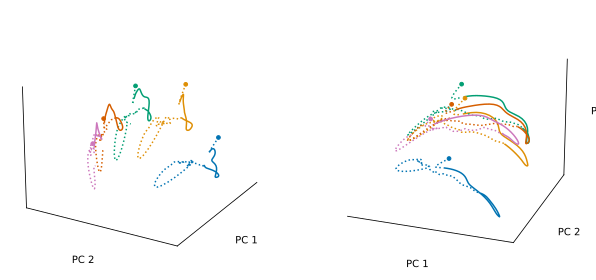

In [449]:
# prepare trial averages
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
    
Xa = np.hstack(trial_averages)

# standardize and apply PCA
Xa = z_score(Xa) 
pca = PCA(n_components=15)
Xa_p = pca.fit_transform(Xa.T).T

# pick the components corresponding to the x, y, and z axes
component_x = 0
component_y = 1
component_z = 2

# create a boolean mask so we can plot activity during stimulus as 
# solid line, and pre and post stimulus as a dashed line
stim_mask = ~np.logical_and(np.arange(trial_size) >= frames_pre_stim,
               np.arange(trial_size) < (trial_size-frames_post_stim))

# utility function to clean up and label the axes
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

sigma = 3 # smoothing amount

# set up a figure with two 3d subplots, so we can have two different views
fig = plt.figure(figsize=[9, 4])
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
axs = [ax1, ax2]

for ax in axs:
    for t, t_type in enumerate(trial_types):

        # for every trial type, select the part of the component
        # which corresponds to that trial type:
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size]
        print(x.shape)
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size]
        
        # apply some smoothing to the trajectories
        x = gaussian_filter1d(x, sigma=sigma)
        y = gaussian_filter1d(y, sigma=sigma)
        z = gaussian_filter1d(z, sigma=sigma)

        # use the mask to plot stimulus and pre/post stimulus separately
        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan

        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')
        
        # plot dots at initial point
        ax.scatter(x[0], y[0], z[0], c=pal[t], s=14)
        
        # make the axes a bit cleaner
        style_3d_ax(ax)
        
# specify the orientation of the 3d plot        
ax1.view_init(elev=22, azim=30)
ax2.view_init(elev=22, azim=110)
plt.tight_layout()

# Animated PCA trajectories in 3D¶


In [372]:
# apply some smoothing to the trajectories
for c in range(Xa_p.shape[0]):
    Xa_p[c, :] =  gaussian_filter1d(Xa_p[c, :], sigma=sigma)

# create the figure
fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear() # clear up trajectories from previous iteration
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)

    for t, t_type in enumerate(trial_types):
    
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size][0:i]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size][0:i]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size][0:i]
                
        stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     np.arange(z.shape[0]) < (trial_size-frames_pre_stim))

        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan
        
        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')

    ax.set_xlim(( -8, 8))
    ax.set_ylim((-8, 8))
    ax.set_zlim((-6, 6))

    return []


anim = animation.FuncAnimation(fig, animate,
                               frames=len(pca_frame), interval=50, 
                               blit=True)

HTML(anim.to_jshtml(default_mode='once'))